Load dataset

In [3]:
import pandas as pd
df = pd.read_csv('data.csv')
df_line2 = df.loc[df['ln_id'] == 2] # Line 2
print(df)
print(df_line2.info())
print(df_line2.describe())

       ln_id  statn_id     dta_strt_tm      dta_end_tm  in_flx_nr  out_flx_nr  \
0          2       247  20210101000000  20210101000459         22          26   
1          2       247  20210101000500  20210101000959         52           0   
2          2       247  20210101001000  20210101001459         51          21   
3          2       247  20210101001500  20210101001959         80          10   
4          2       247  20210101002000  20210101002459         43          14   
...      ...       ...             ...             ...        ...         ...   
99994      2       247  20220212182500  20220212182959        257         107   
99995     14      1438  20220212183000  20220212183459         59          34   
99996      2       247  20220212183000  20220212183459        247         103   
99997     14      1438  20220212183500  20220212183959         61          17   
99998      2       247  20220212183500  20220212183959        226         134   

         dta_tm  
0      20

Get dates

In [4]:
days = list(df_line2['dta_tm'])
days = sorted(list(set(days)))[:-1]
print(len(days),days[0],days[-1])

402 20210101 20220211


Get daily data from 6:00 to 23:00

In [11]:
data_dict = {str(d):dict() for d in days}
for day in days:
    d = df_line2.loc[df['dta_tm'] == day]
    dtms = list(d['dta_strt_tm'])
    tms = [str(t)[8:] for t in dtms]
    imin = tms.index('060000')
    imax = tms.index('230000')
    dtms = dtms[imin:imax+1]
    d_in = list(d['in_flx_nr'])[imin:imax+1]
    d_out = list(d['out_flx_nr'])[imin:imax+1]
    data_dict[str(day)]['in'] = d_in
    data_dict[str(day)]['out'] = d_out
    d_all = [d_in[i]+d_out[i] for i in range(len(d_in))]
    data_dict[str(day)]['all'] = d_all

x_in = []
x_out = []
x_all = []
for d in days:
    x_in.append(data_dict[str(d)]['in'])
    x_out.append(data_dict[str(d)]['out'])
    x_all.append(data_dict[str(d)]['all'])

tms = []
for i in range(6,23):
    for j in range(0,60,5):
        tms.append(str(i).zfill(2)+':'+str(j).zfill(2))
tms.append('23:00')

Visualization

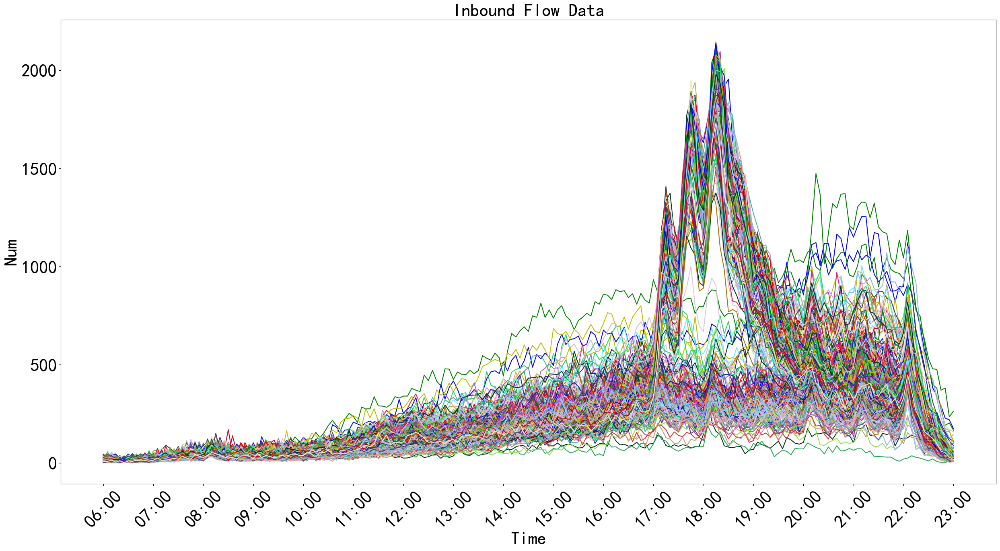

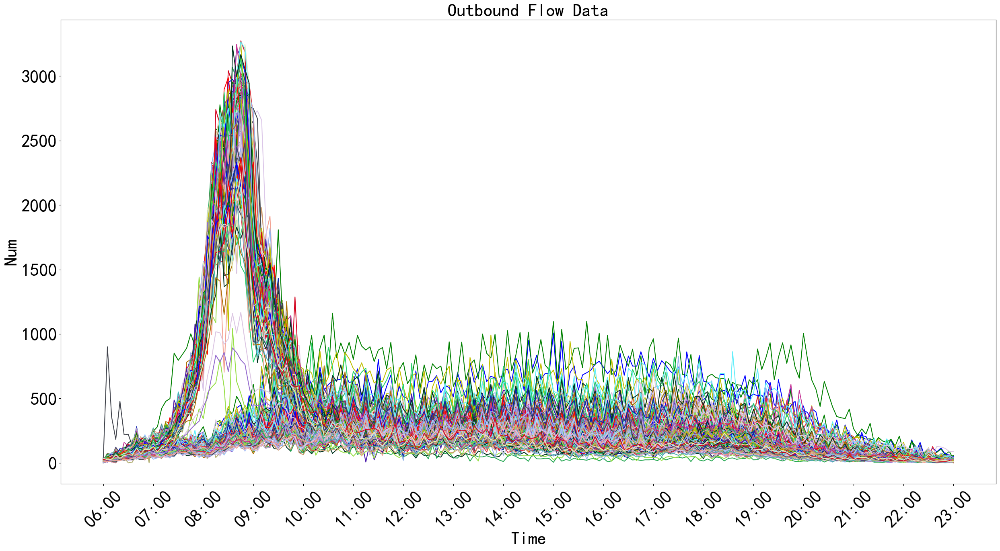

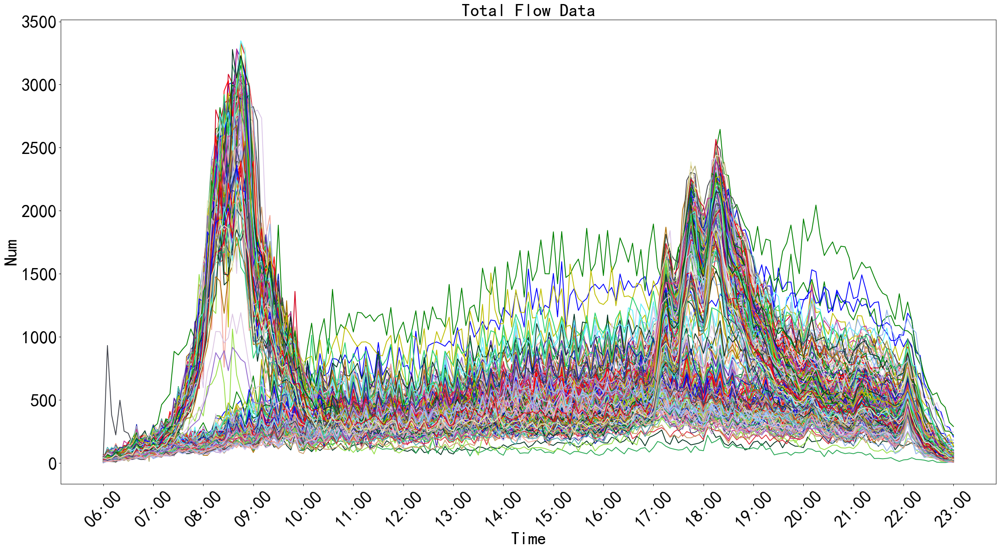

In [16]:
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import matplotlib.pyplot as plt
color=[
'r',
'b',
'g',
'y',
'#C43394',
'#DB2E3A',
'#D4BBDF',
'#64EEFA',
'#26D16C',
'#023320',
'#AE6F05',
'#DCC6E3',
'#946ACE',
'#CB9A6B',
'#A2CAFF',
'#B597CD',
'#DBC6E8',
'#41444C',
'#93B3EA',
'#F3A292',
'#4FABAC',
'#424173',
'#B0AC6F',
'#D3031F',
'#E9ECC1',
'#4919AB',
'#27A854',
'#97DF47',
'#0722AE',
]

plt.rcParams.update({"font.size":20})
plt.figure(1,figsize=(30,15))
x_major_locator=plt.MultipleLocator(12)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.title("Inbound Flow Data",fontsize=32)
plt.xlabel("Time",fontsize=32)
plt.ylabel("Num",fontsize=32)
plt.xticks(fontsize=32,rotation=45)
plt.yticks(fontsize=32)
for i in range(len(x_in)):
    c = color[i%len(color)]
    sns.lineplot(x=tms,y=x_in[i],color=c)
plt.savefig('./resources/all_inbound_flow.jpg')
plt.show()

plt.figure(1,figsize=(30,15))
x_major_locator=plt.MultipleLocator(12)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.title("Outbound Flow Data",fontsize=32)
plt.xlabel("Time",fontsize=32)
plt.ylabel("Num",fontsize=32)
plt.xticks(fontsize=32,rotation=45)
plt.yticks(fontsize=32)
for i in range(len(x_out)):
    c = color[i%len(color)]
    sns.lineplot(x=tms,y=x_out[i],color=c)
plt.savefig('./resources/all_outbound_flow.jpg')
plt.show()

plt.figure(1,figsize=(30,15))
x_major_locator=plt.MultipleLocator(12)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.title("Total Flow Data",fontsize=32)
plt.xlabel("Time",fontsize=32)
plt.ylabel("Num",fontsize=32)
plt.xticks(fontsize=32,rotation=45)
plt.yticks(fontsize=32)
for i in range(len(x_all)):
    c = color[i%len(color)]
    sns.lineplot(x=tms,y=x_all[i],color=c)
plt.savefig('./resources/all_total_flow.jpg')
plt.show()

Remove abnormal data

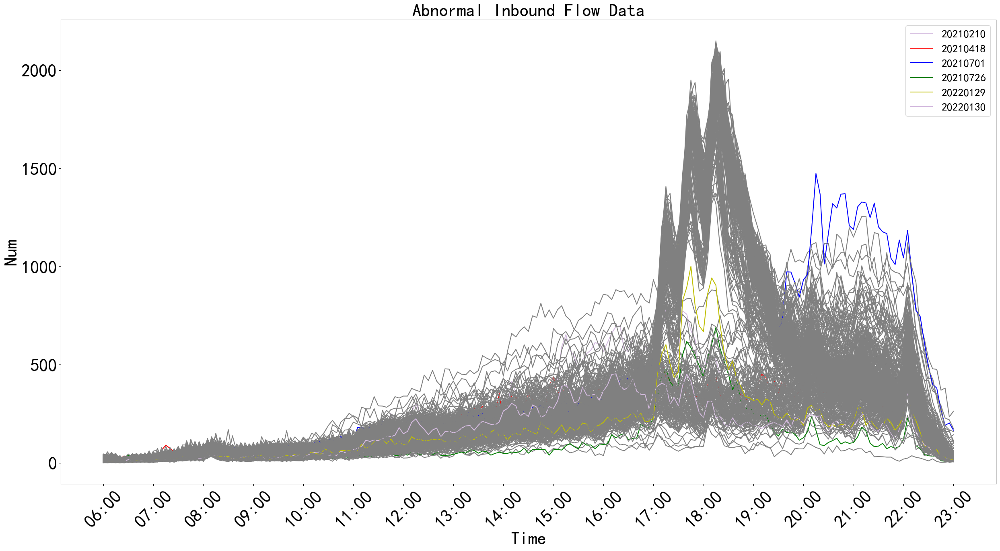

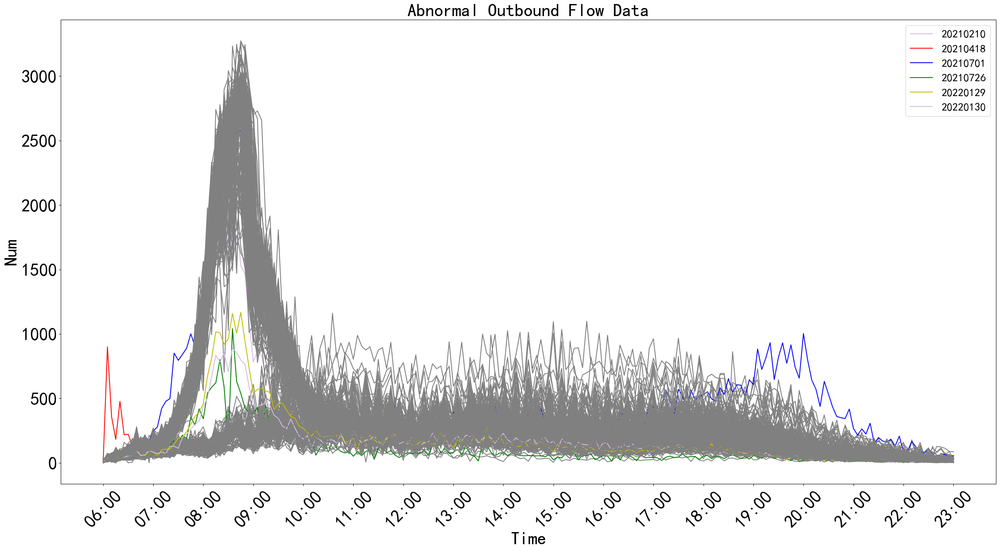

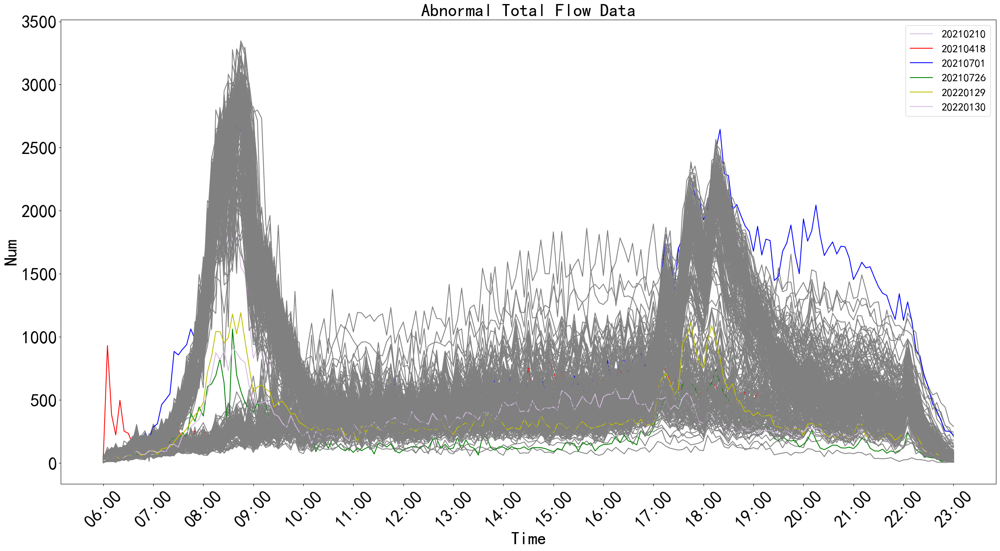

396 20210101 20220211


In [18]:
# 20210418 A marathon race was held.
# 20210701 A big event was held.
# 20210726 Typhoon.
# 20220129 20220130 20210210 Approaching important festivals
keys = [20210418,20210701,20210726,20220129,20220130,20210210]

import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import matplotlib.pyplot as plt

color=['r','b','g','y','#D4BBDF','#D4BBDF','#D4BBDF','#0722AE',]
tms = []
for i in range(6,23):
    for j in range(0,60,5):
        tms.append(str(i).zfill(2)+':'+str(j).zfill(2))
tms.append('23:00')

plt.figure(1,figsize=(30,15))
x_major_locator=plt.MultipleLocator(12)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.rcParams.update({"font.size":20})
plt.title("Abnormal Inbound Flow Data",fontsize=32)
plt.xlabel("Time",fontsize=32)
plt.ylabel("Num",fontsize=32)
plt.xticks(fontsize=32,rotation=45)
plt.yticks(fontsize=32)
for i in range(len(x_in)):
    if keys.count(days[i])>0:
        c = color[keys.index(days[i])]
        sns.lineplot(x=tms,y=x_in[i],color=c,label=days[i])
    else:
        c= 'grey'     
        sns.lineplot(x=tms,y=x_in[i],color=c)
plt.savefig('./resources/abnormal_in_flow.jpg')
plt.show()

plt.figure(1,figsize=(30,15))
x_major_locator=plt.MultipleLocator(12)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.rcParams.update({"font.size":20})
plt.title("Abnormal Outbound Flow Data",fontsize=32)
plt.xlabel("Time",fontsize=32)
plt.ylabel("Num",fontsize=32)
plt.xticks(fontsize=32,rotation=45)
plt.yticks(fontsize=32)
for i in range(len(x_out)):
    if keys.count(days[i])>0:
        c = color[keys.index(days[i])]
        sns.lineplot(x=tms,y=x_out[i],color=c,label=days[i])
    else:
        c= 'grey'     
        sns.lineplot(x=tms,y=x_out[i],color=c)
plt.savefig('./resources/abnormal_out_flow.jpg')
plt.show()

plt.figure(1,figsize=(30,15))
x_major_locator=plt.MultipleLocator(12)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.rcParams.update({"font.size":20})
plt.title("Abnormal Total Flow Data",fontsize=32)
plt.xlabel("Time",fontsize=32)
plt.ylabel("Num",fontsize=32)
plt.xticks(fontsize=32,rotation=45)
plt.yticks(fontsize=32)
for i in range(len(x_all)):
    if keys.count(days[i])>0:
        c = color[keys.index(days[i])]
        sns.lineplot(x=tms,y=x_all[i],color=c,label=days[i])
    else:
        c= 'grey'
        sns.lineplot(x=tms,y=x_all[i],color=c)
plt.savefig('./resources/abnormal_total_flow.jpg')
plt.show()

for k in keys:
    days.remove(k)
print(len(days),days[0],days[-1])

Get daily data from 6:00 to 23:00 without abnormal data

In [19]:
data_dict = {str(d):dict() for d in days}
for day in days:
    d = df_line2.loc[df['dta_tm'] == day]
    d['in_ma5'] = d['in_flx_nr'].rolling(window=3).mean()
    d['in_ma10'] = d['in_flx_nr'].rolling(window=10).mean()
    d['in_ma15'] = d['in_flx_nr'].rolling(window=15).mean()
    d['out_ma5'] = d['out_flx_nr'].rolling(window=3).mean()
    d['out_ma10'] = d['out_flx_nr'].rolling(window=10).mean()
    d['out_ma15'] = d['out_flx_nr'].rolling(window=15).mean()
    d.fillna(0,inplace = True)
    dtms = list(d['dta_strt_tm'])
    tms = [str(t)[8:] for t in dtms]
    imin = tms.index('060000')
    imax = tms.index('230000')
    dtms = dtms[imin:imax+1]
    d_in = list(d['in_flx_nr'])[imin:imax+1]
    d_out = list(d['out_flx_nr'])[imin:imax+1]
    d_in_ma5 = list(d['in_ma5'])[imin:imax+1]
    d_in_ma10 = list(d['in_ma10'])[imin:imax+1]
    d_in_ma15 = list(d['in_ma15'])[imin:imax+1]
    d_out_ma5 = list(d['out_ma5'])[imin:imax+1]
    d_out_ma10 = list(d['out_ma10'])[imin:imax+1]
    d_out_ma15 = list(d['out_ma15'])[imin:imax+1]
    d_all = [d_in[i]+d_out[i] for i in range(len(d_in))]
    d_all_ma5 = [d_in_ma5[i]+d_out_ma5[i] for i in range(len(d_in_ma5))]
    d_all_ma10 = [d_in_ma5[i]+d_out_ma5[i] for i in range(len(d_in_ma10))]
    d_all_ma15 = [d_in_ma5[i]+d_out_ma5[i] for i in range(len(d_in_ma15))]
    data_dict[str(day)]['in'] = d_in
    data_dict[str(day)]['out'] = d_out
    data_dict[str(day)]['in_ma5'] = d_in_ma5
    data_dict[str(day)]['in_ma10'] = d_in_ma10
    data_dict[str(day)]['in_ma15'] = d_in_ma15
    data_dict[str(day)]['out_ma5'] = d_out_ma5
    data_dict[str(day)]['out_ma10'] = d_out_ma10
    data_dict[str(day)]['out_ma15'] = d_out_ma15
    data_dict[str(day)]['all'] = d_all
    data_dict[str(day)]['all_ma5'] = d_all_ma5
    data_dict[str(day)]['all_ma10'] = d_all_ma10
    data_dict[str(day)]['all_ma15'] = d_all_ma15
                                                         
x_in = []
x_out = []
x_in_ma5 = []
x_in_ma10 = []
x_in_ma15 = []
x_out_ma5 = []
x_out_ma10 = []
x_out_ma15 = []
x_all = []
x_all_ma5 = []
x_all_ma10 = []
x_all_ma15 = []
for d in days:
    x_in.append(data_dict[str(d)]['in'])
    x_out.append(data_dict[str(d)]['out'])
    x_in_ma5.append(data_dict[str(d)]['in_ma5'])
    x_in_ma10.append(data_dict[str(d)]['in_ma10'])
    x_in_ma15.append(data_dict[str(d)]['in_ma15'])
    x_out_ma5.append(data_dict[str(d)]['out_ma5'])
    x_out_ma10.append(data_dict[str(d)]['out_ma10'])
    x_out_ma15.append(data_dict[str(d)]['out_ma15'])
    x_all.append(data_dict[str(d)]['all'])
    x_all_ma5.append(data_dict[str(d)]['all_ma5'])
    x_all_ma10.append(data_dict[str(d)]['all_ma10'])
    x_all_ma15.append(data_dict[str(d)]['all_ma15'])
    
print(len(x_in),len(x_in[0]))

396 205


Moving average smoothing

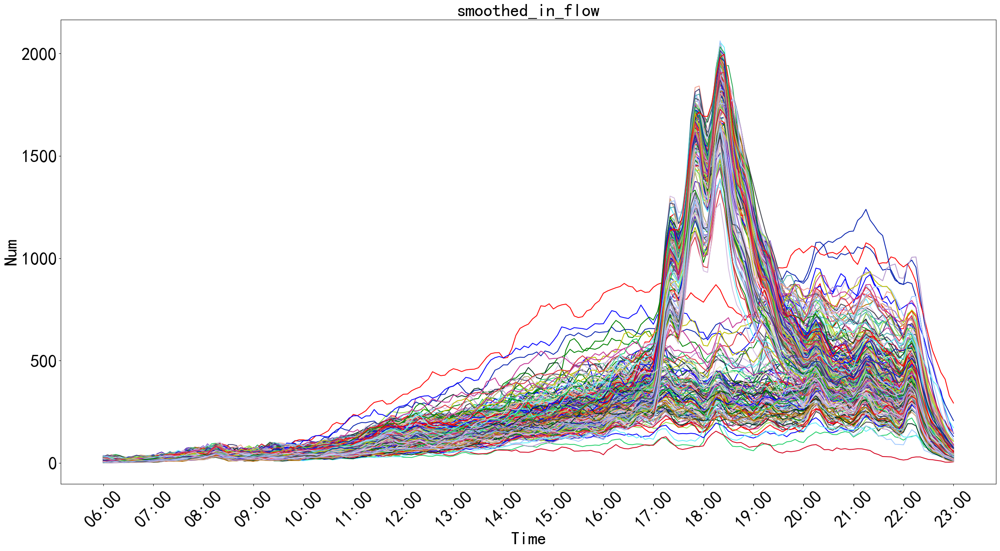

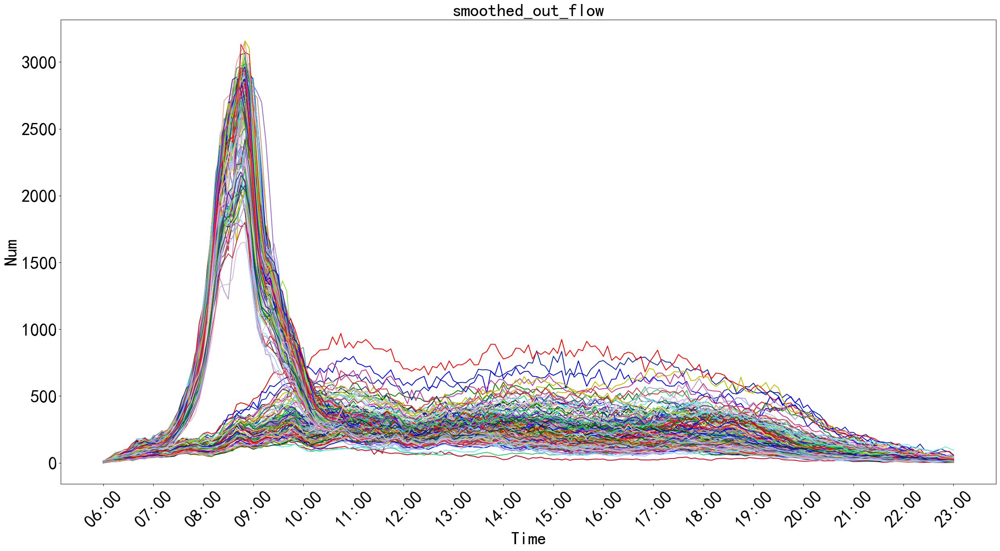

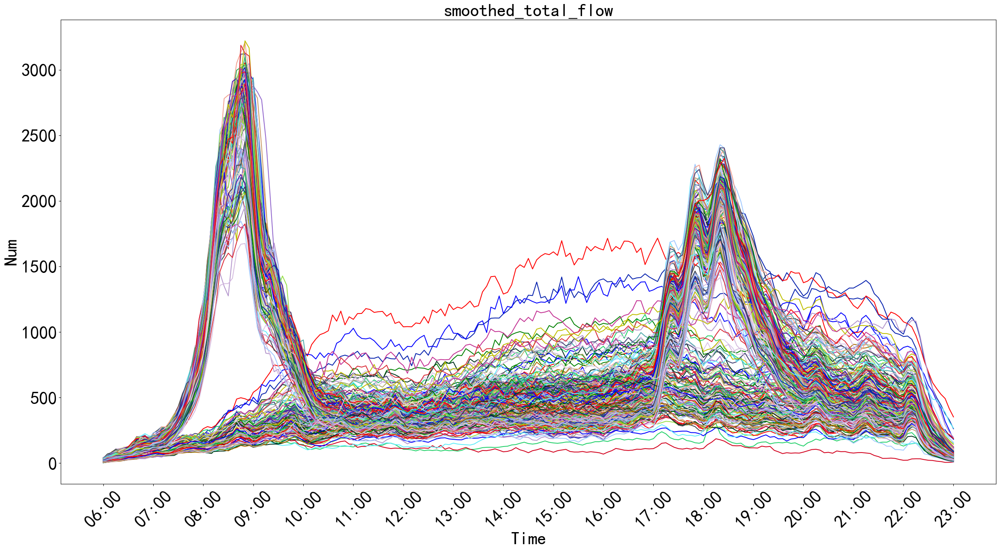

In [20]:
color=[
'r',
'b',
'g',
'y',
'#C43394',
'#DB2E3A',
'#D4BBDF',
'#64EEFA',
'#26D16C',
'#023320',
'#AE6F05',
'#DCC6E3',
'#946ACE',
'#CB9A6B',
'#A2CAFF',
'#B597CD',
'#DBC6E8',
'#41444C',
'#93B3EA',
'#F3A292',
'#4FABAC',
'#424173',
'#B0AC6F',
'#D3031F',
'#E9ECC1',
'#4919AB',
'#27A854',
'#97DF47',
'#0722AE',
]
tms = []
for i in range(6,23):
    for j in range(0,60,5):
        tms.append(str(i).zfill(2)+':'+str(j).zfill(2))
tms.append('23:00')
def show(x, name):
    plt.rcParams.update({"font.size":20})
    plt.figure(1,figsize=(30,15))
    x_major_locator=plt.MultipleLocator(12)
    ax=plt.gca()
    ax.xaxis.set_major_locator(x_major_locator)
    plt.title(name,fontsize=32)
    plt.xlabel("Time",fontsize=32)
    plt.ylabel("Num",fontsize=32)
    plt.xticks(fontsize=32,rotation=45)
    plt.yticks(fontsize=32)
    for i in range(len(x)):
        c = color[i%len(color)]
        sns.lineplot(x=tms,y=x[i],color=c)
    plt.savefig(f'./resources/{name}.jpg')
    plt.show()

show(x_in_ma5, 'smoothed_in_flow')
show(x_out_ma5, 'smoothed_out_flow')
show(x_all_ma5, 'smoothed_total_flow')

In [1]:
def compare(x1, x2, name):
    plt.rcParams.update({"font.size":20})
    plt.figure(1,figsize=(30,8))
    x_major_locator=plt.MultipleLocator(12)
    ax=plt.gca()
    ax.xaxis.set_major_locator(x_major_locator)
    plt.title(name,fontsize=32)
    plt.xlabel("Time",fontsize=32)
    plt.ylabel("Num",fontsize=32)
    plt.xticks(fontsize=32,rotation=45)
    plt.yticks(fontsize=32)
    sns.lineplot(x=tms,y=x1,color=color[0],label='original data')
    sns.lineplot(x=tms,y=x2,color=color[1],label='smoothed data')
    plt.show()
compare(x_all[0],x_all_ma5[0], 'Compare original and smoothed')

NameError: name 'x_all' is not defined

根据轮廓系数确定进出站数据的KMeans聚类、层次聚类 最佳类别数
哪种平均方法

KMeans: 分2类，score 0.7478985547831541，每类个数 [126, 268]
KMeans: 分3类，score 0.7029252932145553，每类个数 [23, 268, 103]
KMeans: 分4类，score 0.5277905131768578，每类个数 [221, 103, 47, 23]
KMeans: 分5类，score 0.43889989854739636，每类个数 [23, 160, 103, 70, 38]
KMeans: 分6类，score 0.39504933483269516，每类个数 [75, 48, 37, 16, 156, 62]
KMeans: 分7类，score 0.34961143263541405，每类个数 [62, 102, 37, 22, 16, 48, 107]
KMeans: 分8类，score 0.33936282527357003，每类个数 [16, 78, 48, 28, 22, 21, 62, 119]
KMeans: 分9类，score 0.3215500983815551，每类个数 [90, 46, 4, 122, 37, 15, 19, 44, 17]
KMeans: 分10类，score 0.30666182770956424，每类个数 [45, 21, 24, 3, 119, 44, 79, 16, 25, 18]


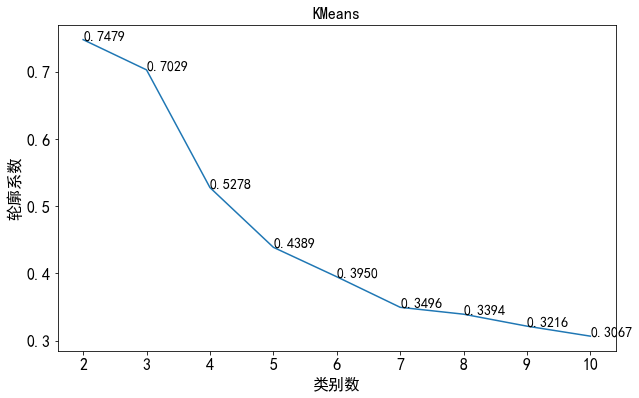

层次聚类: 分2类，score 0.7478985547831541，每类个数 [126, 268]
层次聚类: 分3类，score 0.7086554273944947，每类个数 [268, 107, 19]
层次聚类: 分4类，score 0.5283281434790688，每类个数 [218, 107, 19, 50]
层次聚类: 分5类，score 0.43196107033990694，每类个数 [107, 69, 19, 50, 149]
层次聚类: 分6类，score 0.3819444208527455，每类个数 [19, 69, 60, 50, 149, 47]
层次聚类: 分7类，score 0.38433087821427114，每类个数 [69, 50, 60, 16, 149, 47, 3]
层次聚类: 分8类，score 0.3559065741892078，每类个数 [50, 149, 60, 16, 55, 47, 3, 14]
层次聚类: 分9类，score 0.33589130568026154，每类个数 [37, 149, 60, 16, 55, 47, 3, 14, 13]
层次聚类: 分10类，score 0.34295448110992377，每类个数 [60, 149, 47, 16, 55, 32, 3, 14, 13, 5]


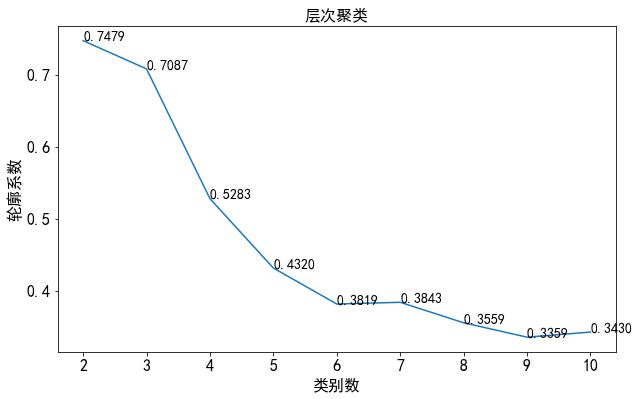

In [18]:
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score 
silhouettescore=[[],[],[],[]]

def lunkuo(Model, x, name):
    score = []
    for i in range(2,11):
        model = Model(n_clusters=i).fit(x)
        labels=list(model.labels_)
        score.append(silhouette_score(x,model.labels_))
        counts = []
        for j in range(i):
            counts.append(labels.count(j))
        print(f'{name}: 分{i}类，score {score[-1]}，每类个数 {counts}')
    plt.rcParams.update({"font.size":20})
    plt.figure(1,figsize=(10,6))
    fontsize=16
    plt.title(name,fontsize=fontsize)
    plt.xlabel("类别数",fontsize=fontsize)
    plt.ylabel("轮廓系数",fontsize=fontsize)
    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    plt.plot(range(2,11),score,linewidth=1.5,linestyle='-')
    for x,y in zip(range(2,11),score):
        plt.text(x,y,'%.4f' % y,fontdict={'fontsize':14})
    plt.savefig(f'{name}.jpg')
    plt.show()
    
# lunkuo(KMeans,x_in,'KMeans-进站客流')
# lunkuo(KMeans,x_in_ma5,'KMeans-进站客流 ma5')
# lunkuo(KMeans,x_in_ma10,'KMeans-进站客流 ma10')
# lunkuo(KMeans,x_in_ma15,'KMeans-进站客流 ma15')
# lunkuo(KMeans,x_out,'KMeans-出站客流')
# lunkuo(KMeans,x_out_ma5,'KMeans-出站客流 ma5')
# lunkuo(KMeans,x_out_ma10,'KMeans-出站客流 ma10')
# lunkuo(KMeans,x_out_ma15,'KMeans-出站客流 ma15')
lunkuo(KMeans,x_all_ma5,'KMeans')
# lunkuo(KMeans,x_all_ma5,'KMeans-总客流 ma5')
# lunkuo(KMeans,x_all_ma10,'KMeans-总客流 ma10')
# lunkuo(KMeans,x_all_ma15,'KMeans-总客流 ma15')

# lunkuo(AgglomerativeClustering,x_in,'层次聚类-进站客流')
# lunkuo(AgglomerativeClustering,x_in_ma5,'层次聚类-进站客流 ma5')
# lunkuo(AgglomerativeClustering,x_in_ma10,'层次聚类-进站客流 ma10')
# lunkuo(AgglomerativeClustering,x_in_ma15,'层次聚类-进站客流 ma15')
# lunkuo(AgglomerativeClustering,x_out,'层次聚类-出站客流')
# lunkuo(AgglomerativeClustering,x_out_ma5,'层次聚类-出站客流 ma5')
# lunkuo(AgglomerativeClustering,x_out_ma10,'层次聚类-出站客流 ma10')
# lunkuo(AgglomerativeClustering,x_out_ma15,'层次聚类-出站客流 ma15')
lunkuo(AgglomerativeClustering,x_all_ma5,'层次聚类')
# lunkuo(AgglomerativeClustering,x_all_ma5,'层次聚类-总客流 ma5')
# lunkuo(AgglomerativeClustering,x_all_ma10,'层次聚类-总客流 ma10')
# lunkuo(AgglomerativeClustering,x_all_ma15,'层次聚类-总客流 ma15')

In [30]:
from sklearn.cluster import KMeans, AgglomerativeClustering
n = 2
X = x_all_ma5
model = AgglomerativeClustering(n_clusters=n)
model.fit(X)
print(model.labels_)
labels_2 = list(model.labels_)
for i in range(n):
    print(i, labels_2.count(i))

n = 3
X = x_all_ma5
model = AgglomerativeClustering(n_clusters=n)
model.fit(X)
print(model.labels_)
labels_3 = list(model.labels_)
for i in range(n):
    print(i, labels_3.count(i))

n=4
X = x_all_ma5
model = AgglomerativeClustering(n_clusters=n)
model.fit(X)
print(model.labels_)
labels_4 = list(model.labels_)
for i in range(n):
    print(i, labels_4.count(i))

[0 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1
 0 0 0 0 0 0 0 1 1 1 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1
 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 0 1 1
 1 1 1 1 0 0 0 0 0 1 1 1 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1
 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 1 0 0 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 1 0 0 1
 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1
 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 1 0 0 0 1 1 1 0
 1 1 1 1 1 0 0 0 0 0 0 0 1 1 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1
 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1
 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 0 1 1 1 1 0 0 1 1 1 1 1
 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 0 0 0 0 0 1 1 1 1 1]
0 128
1 268
[1 1 1 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0
 1 1 1 1 1 1 1 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0
 1 1 0 0 0 0 0 1 1 0 0 0 0 0 1 2 1

In [31]:
open('2类标签.txt','w').write(str(labels_2))
open('3类标签.txt','w').write(str(labels_3))
open('4类标签.txt','w').write(str(labels_4))

1188

In [61]:
day_infos = []
for d in days:
    d = str(d)
    dt = datetime.date(int(d[:4]), int(d[4:6]), int(d[6:]))
    assert is_holiday(dt) != is_workday(dt)
    if is_holiday(dt):
        on_holiday, holiday_name = chinese_calendar.get_holiday_detail(dt)
    else:
        holiday_name = '工作日'
    day_infos.append(f'{dt} 星期{dt.weekday()+1} {holiday_name}')

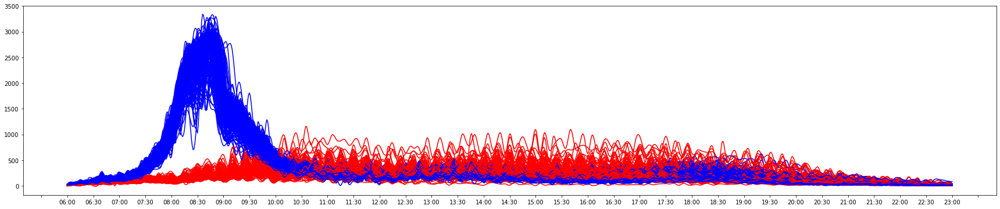

In [61]:
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(1,figsize=(30,6))
x_major_locator=plt.MultipleLocator(30)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
color=[
'r',
'b',
'g',
'y',
]

# 平滑
import copy
X=x_all_ma5.copy()
from scipy.interpolate import make_interp_spline
import matplotlib.pyplot as plt
for i in range(len(X)):
    x = X[i]
    y = list(range(0,len(x)))
    m = make_interp_spline(y, x)
    y = np.linspace(0, len(x)-1, 1021)
    X[i] = m(y).tolist()

tms = []
for i in range(6,23):
    for j in range(0,60):
        tms.append(str(i).zfill(2)+':'+str(j).zfill(2))
#         if j % 10 == 0:
#             tms.append(str(i).zfill(2)+':'+str(j/10).zfill(2))
#         else:
#             tms.append('')
tms.append('23:00')
for i in range(len(X)):
    c = color[model.labels_[i]]
    sns.lineplot(tms,X[i],color=c)
plt.show()